# Calgary's Demographic Structure: Spatial and Temporal Trends

## Data 601 Final project - Fall 2020

## By Team 10
- Chang Sun
- Bhanu Vedula
- Sai Krishna Lakkavaram

# Introduction
Civic Census is an official program undertaken by Municipal Governments annually and Federal Governments once in five years.
Information acquired through this online and door to door program includes, dwelling size, count of residents living in each community or geographic unit. Supplementary information including age, gender and education are also collected on a schedule.

Municipalities find the census information beneficial for planning community services like planning for infrastructure like schools, recreation facilities, senior living arrangements etc. to support the growing population and weigh the effectiveness of the services currently provided.

Our purpose is to analyze the age distribution of City of Calgary. Through visualization we want to share the story of the demographic profile of the city as it comes to the three groups of population namely children (youth) ages 0-14, working population between ages 15-64, and senior population ages 65+.

## Datasets

The datasets that were used in our study are available on the Open Calgary Data Portal shared by the City of Calgary. The data is open to use under the creative commons license https://data.calgary.ca/d/Open-Data-Terms/u45n-7awa. The Civic_Census_by_Community_Age_and_Gender contains age and gender information collected from 1996 to 2019.  Additionally the Calgary Community Boundaries shapefile and geojson datasets to map the data spatially.  

Our scope of work is to analyze the data for the last five years when age information was collected in the census, i.e 2009,2011,2014,2016,2019.The tabular dataset provides age information in 5 year intervals enumerated at the community level. It also includes the gender information, which has been omitted in the scope of our work. The columns that are of our key interest are the resident count, age ranges, community names and the year the information was collected.


## Guiding Questions

Demographic structure provides an insight of a city’s development. It reveals the trend in which a city is growing towards and provides a guidance to almost every aspect of municipal decision, including health care, education, community development and even immigration policy. This study is to conduct an exploratory analysis on the City of Calgary to explore how the demographic profile variable of age varies. 

1.	 Is Calgary population growing or declining? 

2.	 Age distribution of Calgary over the last 5 years? 

3.	 Is Calgary’s population young or aging? 

4.	 Which community is aging fastest? 

5.	 What is the dependency ratio of the child and senior population to the working age population?

To answer our guiding questions, we will use Python within the Jupyter notebook environment to create visualizations of the dataset. The main software libraries we’ll be importing are Pandas, Matplotlib, Geopandas, Pyplot etc.


### Importing required libraries for analysis

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

import plotly as plotly
import plotly.graph_objs as go
import plotly.express as px

import geopandas as gpd
from IPython.display import Image

import json

import imageio
from pathlib import Path

## Data wrangling and cleanup

Our cleaning and wrangling activities included:

1.  Filter data:
    Dataset includes census from year 1996 to 2019. Whereas only 2009 to 2019 are of interest of this project.
    
2.  Data type conversion:
    Convert values from string to integer to calculate resident count. 
    
3.  Pivot Age Data:
    The Age Range information is listed as rows and we need it to be as columns to calculate total of each population age group.
    
4.  Calculate additional columns:
    New columns will be added for population totals by age group children, senior and working
    Aged-child ratio and age dependency ratio are also calculated.  
    
5.  Manipulating data frame:
    Organize the data frames grouped by Year, Community Name, and Sum of population groups
    
6.  For the year 2019, an additional column 'OTHER' for LGBTQ count was collected. Therefore, 2019 dataset is extracted separately for further wrangling.


In [2]:
rawDF=pd.read_csv(r'Civic_Census_by_Community__Age_and_Gender.csv')
display(rawDF)

,YEAR,COMM_CODE,AGE_RANGE,MALES,FEMALES,OTHER
0,1996,ABB,0-4,635,0,NaN
1,1996,ABB,5-14,"1,438",0,NaN
2,1996,ABB,15-19,462,0,NaN
3,1996,ABB,20-24,347,0,NaN
4,1996,ABB,25-34,"2,842",0,NaN
...,...,...,...,...,...,...
22867,2019,YKV,35-44,0,0,0.0
22868,2019,YKV,45-54,0,0,0.0
22869,2019,YKV,55-64,0,0,0.0
22870,2019,YKV,65-74,0,0,0.0


In [3]:
df0916=rawDF[(rawDF.YEAR==2009)|(rawDF.YEAR==2011)|(rawDF.YEAR==2014)|(rawDF.YEAR==2016)].copy()
df2019=rawDF[rawDF.YEAR==2019].copy()

# Delete the Raw Data datafram
del rawDF

In [4]:
# Convert columns 'MALES' and 'FEMALES' datatype to int by handling the thousands values in #,### format.

df0916[['MALES','FEMALES']]=df0916[['MALES','FEMALES']].applymap(lambda x:''.join(x.split(',')))
df0916[['MALES','FEMALES']]=df0916[['MALES','FEMALES']].astype('int')

df2019[['MALES','FEMALES']]=df2019[['MALES','FEMALES']].applymap(lambda x:''.join(x.split(',')))
df2019[['MALES','FEMALES']]=df2019[['MALES','FEMALES']].astype('int')

In [5]:
# Calculate resident_count for each age range by summing up 

#  -  'MALES' and 'FEMALES' for year 2009-2016. 
#  -  'MALES' 'FEMALES' and 'OHTER' (LGBTQ counts) for year 2019


df0916['RESIDENT_COUNT']=df0916['MALES']+df0916['FEMALES']
df0916.drop(['MALES','FEMALES','OTHER'],axis=1,inplace=True)

df2019['RESIDENT_COUNT']=df2019['MALES']+df2019['FEMALES']+df2019['OTHER']
df2019.drop(['MALES','FEMALES','OTHER'],axis=1,inplace=True)

In [6]:
# Merge both data sets into one Dataframe

df = pd.concat([df0916,df2019])

# Delete the data frames to free some memory

del df0916
del df2019

# Pivot column 'AGE_RANGE' from rows to columns.

df = df.groupby(['YEAR','COMM_CODE','AGE_RANGE']).RESIDENT_COUNT.sum().unstack().reset_index()
display(df.head())

AGE_RANGE,YEAR,COMM_CODE,0-4,15-19,20-24,25-34,35-44,45-54,5-14,55-64,65-74,75+
0,2009,ABB,444.0,450.0,462.0,1020.0,1001.0,1013.0,873.0,496.0,191.0,82.0
1,2009,ABP,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2009,ACA,413.0,482.0,830.0,1806.0,1680.0,1712.0,804.0,970.0,937.0,940.0
3,2009,ALB,409.0,321.0,498.0,1123.0,1064.0,906.0,647.0,522.0,375.0,182.0
4,2009,ALT,602.0,375.0,647.0,1840.0,1680.0,1289.0,739.0,669.0,276.0,606.0


In [7]:
# Noticed age range 5-14 column is not in the right order, adjust position.

range514=df['5-14']
df.drop('5-14',axis=1,inplace=True)
df.insert(3,r'5-14',range514)
df.columns.name=''

# Delete variable for memory clean up
del range514

# display(df)

In [8]:
# Add an additional column of 'RESIDENT_COUNT' for each community by summing up all age ranges counts.

rescnt=df.set_index(['YEAR','COMM_CODE']).apply(lambda x: np.sum(x),axis=1)
rescnt.index=range(len(df))
df.insert(2,'RESIDENT_COUNT',rescnt)

# deleting the variable to save memory
del rescnt

# Communities with zero residents needs to be filtered out, such as industrial zones.

df.dropna(inplace=True)
df.drop(df[df['RESIDENT_COUNT']==0].index,axis=0,inplace=True)

In [9]:
df[['RESIDENT_COUNT','0-4','5-14','15-19','20-24','25-34','35-44','45-54','55-64','65-74','75+']]=df[['RESIDENT_COUNT','0-4','5-14','15-19','20-24','25-34','35-44','45-54','55-64','65-74','75+']].astype('int')
df.COMM_CODE=df.COMM_CODE.astype('str')
df.index=range(1,len(df)+1)
df

,YEAR,COMM_CODE,RESIDENT_COUNT,0-4,5-14,15-19,20-24,25-34,35-44,45-54,55-64,65-74,75+
1,2009,ABB,6032,444,873,450,462,1020,1001,1013,496,191,82
2,2009,ACA,10574,413,804,482,830,1806,1680,1712,970,937,940
3,2009,ALB,6047,409,647,321,498,1123,1064,906,522,375,182
4,2009,ALT,8723,602,739,375,647,1840,1680,1289,669,276,606
5,2009,APP,6379,398,985,431,525,1079,1122,1046,424,250,119
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1061,2019,X10,220,21,21,9,12,22,46,34,29,19,7
1062,2019,X11,259,32,14,25,26,29,39,27,36,24,7
1063,2019,X12,449,32,51,40,41,35,46,65,79,40,20
1064,2019,X13,326,40,36,18,18,80,26,35,39,21,13


### Categorize the population into following three groups
- Young - Age range [0-14] inclusive
- Working - Age range [15-64] inclusive
- Senior - Age range [65+] inclusive
#### 

In [10]:
df['CHILD_COUNT'] = df['0-4'] + df['5-14']
df['MIDDLE_COUNT'] = df['15-19'] + df['20-24'] + df['25-34'] + df['35-44'] + df['45-54'] + df['55-64']
df['SR_COUNT'] = df['65-74'] + df['75+']

# Capture the data columns required for further analysis into a seperate dataframe
finalDF = pd.DataFrame({'YEAR' : df['YEAR'], 'COMM_CODE': df['COMM_CODE'],'YOUNG_AGE_COUNT' : df['CHILD_COUNT'], 'WORKING_AGE_COUNT' : df['MIDDLE_COUNT'], 'SR_AGE_COUNT' : df['SR_COUNT'], 'TOTAL_RESIDENT_COUNT' : df['RESIDENT_COUNT']})

# Delete the previos dataframe to release some memory allocation
del df

display(finalDF)

,YEAR,COMM_CODE,YOUNG_AGE_COUNT,WORKING_AGE_COUNT,SR_AGE_COUNT,TOTAL_RESIDENT_COUNT
1,2009,ABB,1317,4442,273,6032
2,2009,ACA,1217,7480,1877,10574
3,2009,ALB,1056,4434,557,6047
4,2009,ALT,1341,6500,882,8723
5,2009,APP,1383,4627,369,6379
...,...,...,...,...,...,...
1061,2019,X10,42,152,26,220
1062,2019,X11,46,182,31,259
1063,2019,X12,83,306,60,449
1064,2019,X13,76,216,34,326


## Question 1. Is Calgary population growing or declining?
- For this we have to calculate the total resident counts per each year and the respective [population growth rate](https://en.wikipedia.org/wiki/Population_growth#Population_growth_rate)


In [11]:
# Calculate the total resident count for each year

yearlyCountsDF = finalDF.groupby('YEAR', as_index=False).sum()

yearlyCountsDF['YEAR_SHIFT'] = yearlyCountsDF['YEAR']-yearlyCountsDF['YEAR'].shift(1)

# Population growth rate

yearlyCountsDF['GROWTH_RATE'] = (yearlyCountsDF.pct_change()['TOTAL_RESIDENT_COUNT']/yearlyCountsDF['YEAR_SHIFT'])*100

display(yearlyCountsDF)

,YEAR,YOUNG_AGE_COUNT,WORKING_AGE_COUNT,SR_AGE_COUNT,TOTAL_RESIDENT_COUNT,YEAR_SHIFT,GROWTH_RATE
0,2009,188277,778606,98572,1065455,NaN,NaN
1,2011,194649,789772,106515,1090936,2.0,1.195780
2,2014,218555,856424,120215,1195194,3.0,3.185583
3,2016,231219,872570,131382,1235171,2.0,1.672406
4,2019,239816,892541,153354,1285711,3.0,1.363914


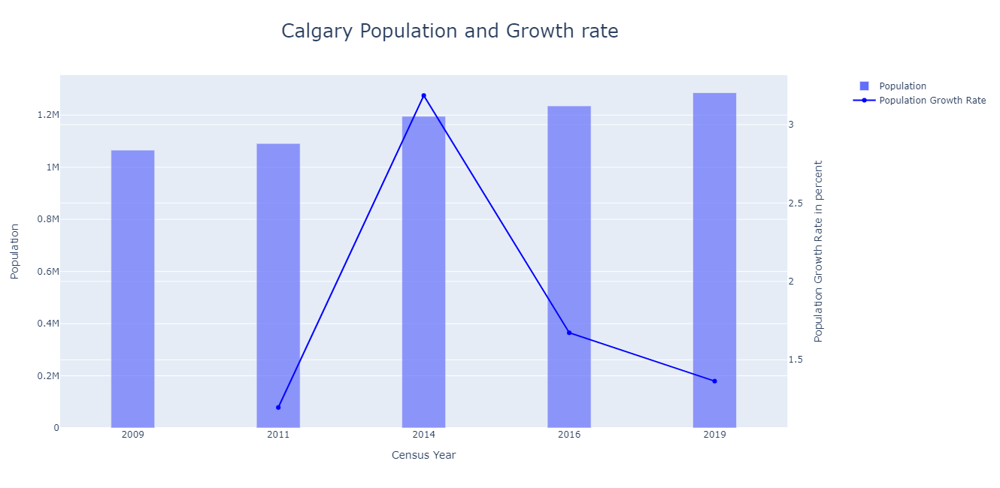

In [12]:
fig1=make_subplots(specs=[[{'secondary_y':True}]])
trace1=go.Bar(x=yearlyCountsDF['YEAR'],y=yearlyCountsDF['TOTAL_RESIDENT_COUNT'],name='Population',marker_opacity=0.7, width=0.3)
trace2=go.Scatter(x=yearlyCountsDF['YEAR'],y=yearlyCountsDF['GROWTH_RATE'],name='Population Growth Rate',marker_color='blue')
fig1.add_trace(trace1,secondary_y=False)
fig1.add_trace(trace2,secondary_y=True)
fig1.update_xaxes(title_text='Census Year',type='category')
fig1.update_yaxes(title_text='Population',secondary_y=False)
fig1.update_yaxes(title_text='Population Growth Rate in percent',secondary_y=True)
fig1.update_layout(title_text='Calgary Population and Growth rate',title_font_size=25, title_x=0.45,title_y=0.95,height=650)
fig1.show()

#### Observation:
1. Calgary population has grown from 1.06 million in 2009 to 1.28 million in 2019. The every census year.

2. Population grew fastest from 2011 to 2014 (rate of 3.18 percent), which might relate to oil and gas industry prosperity. Growing pace has slowed down from 2014 to 2016, similarly, might relate to the economic downturn of oil and gas industry.


## Question 2: Age distribution of Calgary
- Here we are analyzing how does Calgary's different age group's population was distributed over the years


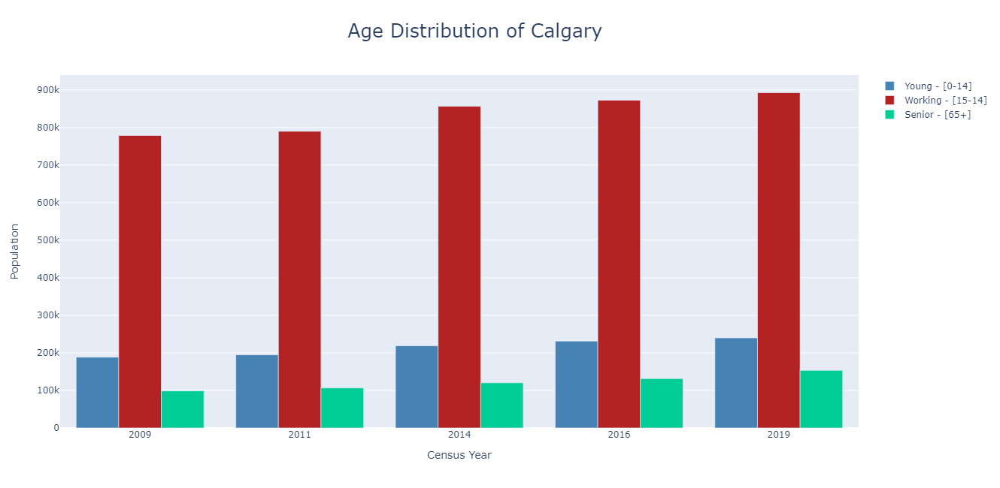

In [13]:
fig = go.Figure(data=[
    go.Bar(name='Young - [0-14]', x=yearlyCountsDF['YEAR'], y=yearlyCountsDF['YOUNG_AGE_COUNT'], marker_color='steelblue'),
    go.Bar(name='Working - [15-14]', x=yearlyCountsDF['YEAR'], y=yearlyCountsDF['WORKING_AGE_COUNT'],marker_color='firebrick'),
    go.Bar(name='Senior - [65+]', x=yearlyCountsDF['YEAR'], y=yearlyCountsDF['SR_AGE_COUNT'])
])

fig.update_xaxes(title_text='Census Year', type='category')
fig.update_yaxes(title_text='Population')

# Change the bar mode
fig.update_layout(barmode='group', title_text='Age Distribution of Calgary', title_font_size=25, title_x=0.475,title_y=0.95, height=650)
fig.show()

#### Observation:
- From the above plot we can notice that the population of all the age groups has been increasing over the years.

In [14]:
# Calculate the increments over the period

increment=yearlyCountsDF-yearlyCountsDF.shift(axis=0)

increment['YEAR']= yearlyCountsDF['YEAR']
increment['YOUNG_INC_PRCNT']=increment['YOUNG_AGE_COUNT']*100/increment['TOTAL_RESIDENT_COUNT']
increment['WORKING_INC_PRCNT']=increment['WORKING_AGE_COUNT']*100/increment['TOTAL_RESIDENT_COUNT']
increment['SR_INC_PRCNT']=increment['SR_AGE_COUNT']*100/increment['TOTAL_RESIDENT_COUNT']

#Cleanup Dataframe
increment.drop(0, inplace=True)
increment.drop(['YOUNG_AGE_COUNT','WORKING_AGE_COUNT','SR_AGE_COUNT','TOTAL_RESIDENT_COUNT','YEAR_SHIFT','GROWTH_RATE'], axis=1, inplace=True)

display(increment)

,YEAR,YOUNG_INC_PRCNT,WORKING_INC_PRCNT,SR_INC_PRCNT
1,2011,25.006868,43.820886,31.172246
2,2014,22.929655,63.929866,13.140478
3,2016,31.678215,40.388223,27.933562
4,2019,17.010289,39.515235,43.474476


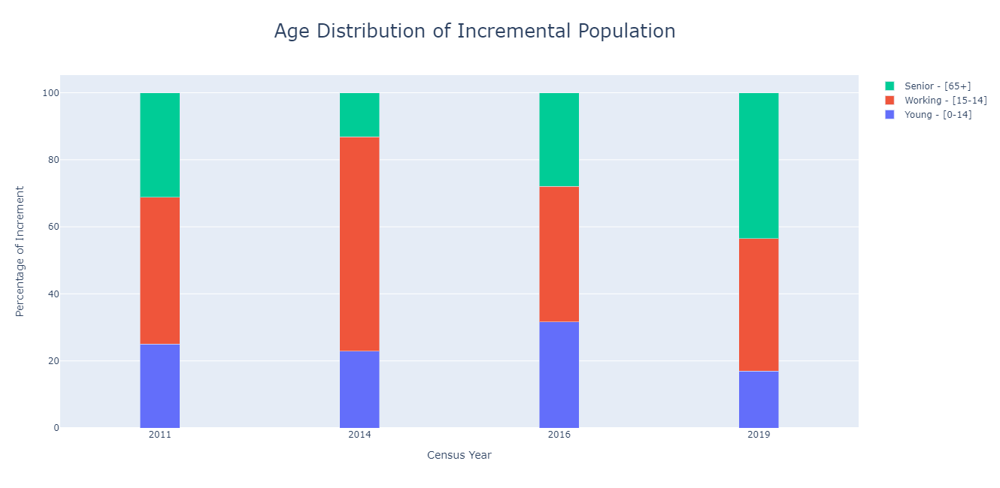

In [15]:
# Plot the increments

fig = go.Figure(data=[
    go.Bar(x=increment['YEAR'],y=increment['YOUNG_INC_PRCNT'],name='Young - [0-14]',width=0.2),
    go.Bar(x=increment['YEAR'],y=increment['WORKING_INC_PRCNT'],name='Working - [15-14]',width=0.2),
    go.Bar(x=increment['YEAR'],y=increment['SR_INC_PRCNT'],name='Senior - [65+]',width=0.2)
])

fig.update_xaxes(type='category')

# Change the bar mode
fig.update_layout(barmode='stack',title_text='Age Distribution of Incremental Population',
                 title_font_size=25, title_x=0.475,title_y=0.95,height=650,
                 xaxis_title_text='Census Year',
                 yaxis_title_text='Percentage of Increment'
                 )

fig.show()

#### Observation:
- From the above plot we can notice that the Senior population contribution has increased since 2014 and the Younger population contribution has declined.

# Question 3 : Is Calgary’s population young or aging

## Aged-Child Ratio 

Provides the insight of whether a city is young or aging. An animated bar charts will be utilized to check the detailed age structure change over years. 
The Aged-Child ratio is calculated using the following equation (Lacey & Speizer, 2015) :

- Aged-Child Ratio=(Population of ages 65+)/(Population of ages 0-14)


In [16]:
yearlyCountsDF['AGED_CHILD_RATIO'] = yearlyCountsDF['SR_AGE_COUNT']/yearlyCountsDF['YOUNG_AGE_COUNT']

display(yearlyCountsDF)

,YEAR,YOUNG_AGE_COUNT,WORKING_AGE_COUNT,SR_AGE_COUNT,TOTAL_RESIDENT_COUNT,YEAR_SHIFT,GROWTH_RATE,AGED_CHILD_RATIO
0,2009,188277,778606,98572,1065455,NaN,NaN,0.523548
1,2011,194649,789772,106515,1090936,2.0,1.195780,0.547216
2,2014,218555,856424,120215,1195194,3.0,3.185583,0.550045
3,2016,231219,872570,131382,1235171,2.0,1.672406,0.568215
4,2019,239816,892541,153354,1285711,3.0,1.363914,0.639465


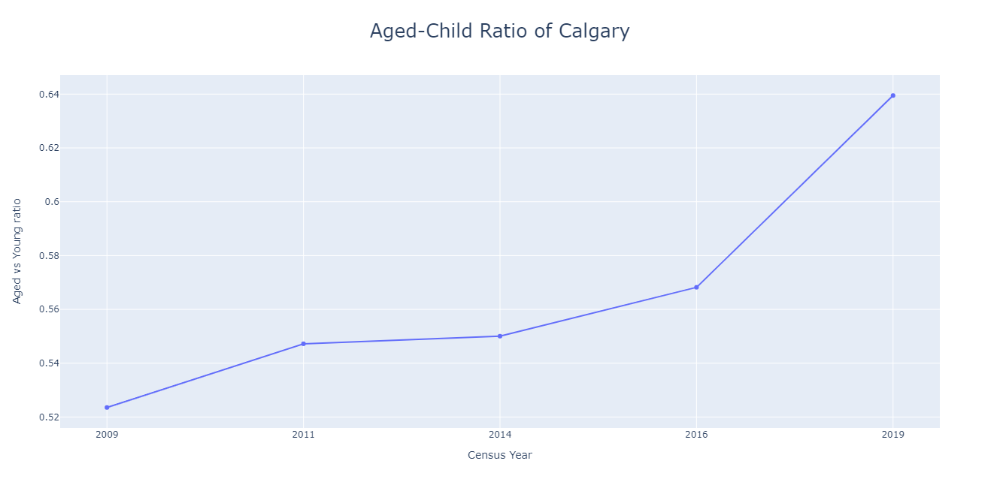

In [17]:
fig = go.Figure(data=[
                      go.Scatter(x=yearlyCountsDF['YEAR'], y=yearlyCountsDF['AGED_CHILD_RATIO'])
                     ])

fig.update_xaxes(title_text='Census Year', type='category')
fig.update_yaxes(title_text='Aged vs Young ratio')
fig.update_layout(title_text='Aged-Child Ratio of Calgary', title_x=0.5,title_y=0.95, title_font_size=25, height=650)
fig.show()

### Observation:

The above plot represents the Aged-Child ratio is increasing over the years i.e the growth in Senior population is more than Younger population.
- The Age Distribution of Incremental Population also supports the same by replicating the Younger population contribution is reducing from 2014 where as there is increase in the Senior population contribution to the overall population growth.
- This implies that Calgary is aging.


# Question 4 : Which community is aging faster ?

The ratio is expressed as percentage per 100 persons. This statistic describes how many elderly exist per 100 children in a community.
The higher the ratio the more elderly in a community, and lower the ratio the younger the community is.

The Community Census 2019 geojson file is read into geopandas dataframe to add the Community name as id column to the existing tabular pandas dataframe. Secondary community codes that were not in the geojson file are removed from the dataframe.
Further to avoid to dive by zero (infinity) values all rows that have zero as total in Senior, Working, Young Age count columns are dropped from the dataframe.


#### Community level breakdown

In [18]:
#communities that do not exist in geojson boundary data
comm_noBound=['CFC','CFL','CON','DOU','SKY','SYV,','VIC','X01','X02','X03','X04','X05','X06','X07','X08','X09','X10','X11','X12','X13','X14']
finalDF[finalDF.COMM_CODE.isin(comm_noBound)]
finalDF = finalDF[~finalDF.COMM_CODE.isin(comm_noBound)]
finalDF

,YEAR,COMM_CODE,YOUNG_AGE_COUNT,WORKING_AGE_COUNT,SR_AGE_COUNT,TOTAL_RESIDENT_COUNT
1,2009,ABB,1317,4442,273,6032
2,2009,ACA,1217,7480,1877,10574
3,2009,ALB,1056,4434,557,6047
4,2009,ALT,1341,6500,882,8723
5,2009,APP,1383,4627,369,6379
...,...,...,...,...,...,...
1047,2019,WIN,569,2559,471,3599
1048,2019,WLD,547,1755,392,2694
1049,2019,WND,522,3463,587,4572
1050,2019,WOO,1122,3756,1109,5987


In [19]:
#Replace zero to NAN and drop them as they cause inf values
finalDF.replace(0, np.nan, inplace=True)
finalDF.dropna(inplace=True)
finalDF

,YEAR,COMM_CODE,YOUNG_AGE_COUNT,WORKING_AGE_COUNT,SR_AGE_COUNT,TOTAL_RESIDENT_COUNT
1,2009,ABB,1317.0,4442.0,273.0,6032
2,2009,ACA,1217.0,7480.0,1877.0,10574
3,2009,ALB,1056.0,4434.0,557.0,6047
4,2009,ALT,1341.0,6500.0,882.0,8723
5,2009,APP,1383.0,4627.0,369.0,6379
...,...,...,...,...,...,...
1047,2019,WIN,569.0,2559.0,471.0,3599
1048,2019,WLD,547.0,1755.0,392.0,2694
1049,2019,WND,522.0,3463.0,587.0,4572
1050,2019,WOO,1122.0,3756.0,1109.0,5987


In [20]:
#Calculate Aged-Child Ratio for every community

finalDF.loc[:,'AGEDCHILDRATIO'] = (finalDF['SR_AGE_COUNT'] / finalDF['YOUNG_AGE_COUNT'])*100

#Calculate Child Dependency Ratio per community
#child dependency ratio is caluated as child population /working population *100

finalDF.loc[:,'AGE_DEPENDENCY_RATIO'] = (finalDF['YOUNG_AGE_COUNT']+finalDF['SR_AGE_COUNT'])/ finalDF['WORKING_AGE_COUNT'] *100
finalDF

,YEAR,COMM_CODE,YOUNG_AGE_COUNT,WORKING_AGE_COUNT,SR_AGE_COUNT,TOTAL_RESIDENT_COUNT,AGEDCHILDRATIO,AGE_DEPENDENCY_RATIO
1,2009,ABB,1317.0,4442.0,273.0,6032,20.728929,35.794687
2,2009,ACA,1217.0,7480.0,1877.0,10574,154.231717,41.363636
3,2009,ALB,1056.0,4434.0,557.0,6047,52.746212,36.377988
4,2009,ALT,1341.0,6500.0,882.0,8723,65.771812,34.200000
5,2009,APP,1383.0,4627.0,369.0,6379,26.681128,37.864707
...,...,...,...,...,...,...,...,...
1047,2019,WIN,569.0,2559.0,471.0,3599,82.776801,40.640875
1048,2019,WLD,547.0,1755.0,392.0,2694,71.663620,53.504274
1049,2019,WND,522.0,3463.0,587.0,4572,112.452107,32.024256
1050,2019,WOO,1122.0,3756.0,1109.0,5987,98.841355,59.398296


In [21]:
#https://plotly.com/python/choropleth-maps/
#Prepare geojson data to join and plot a choropleth map
calgary_communities = ("Census2019.geojson")
comm_df = gpd.read_file(calgary_communities)
comm_df.columns
comm_df= comm_df[['comm_code','name','geometry']]
#comm_df.dtypes
#Projection Information
comm_df.crs
#Reproject to NAD83 #TM
comm_df.to_crs("EPSG:3776")

#comm_df.plot()


,comm_code,name,geometry
0,LEG,LEGACY,"MULTIPOLYGON (((-1548.456 5636290.211, -1504.7..."
1,HPK,HIGHLAND PARK,"MULTIPOLYGON (((-4844.586 5662162.748, -4672.7..."
2,CNS,CORNERSTONE,"MULTIPOLYGON (((5706.040 5671109.393, 5826.785..."
3,MON,MONTGOMERY,"MULTIPOLYGON (((-11531.680 5660594.105, -11521..."
4,TEM,TEMPLE,"MULTIPOLYGON (((4544.064 5662209.786, 4544.153..."
...,...,...,...
301,FRA,FRANKLIN,"MULTIPOLYGON (((1281.884 5658969.877, 1282.518..."
302,SGL,STONEGATE LANDING,"MULTIPOLYGON (((1882.102 5670709.423, 2096.673..."
303,CAP,CAPITOL HILL,"MULTIPOLYGON (((-6658.704 5659797.274, -6641.4..."
304,HID,HIDDEN VALLEY,"MULTIPOLYGON (((-6628.122 5668684.129, -6628.1..."


In [22]:

calgary_communities=json.load(open("Census2019.geojson",'r'))
calgary_communities['features'][0].keys()
community_name={}
for feature in calgary_communities['features']:
    feature['id']=feature['properties']['name']
    community_name[feature['properties']['comm_code']]=feature['id']
community_name
finalDF['NAME']=finalDF['COMM_CODE'].apply(lambda x: community_name[x])
finalDF


,YEAR,COMM_CODE,YOUNG_AGE_COUNT,WORKING_AGE_COUNT,SR_AGE_COUNT,TOTAL_RESIDENT_COUNT,AGEDCHILDRATIO,AGE_DEPENDENCY_RATIO,NAME
1,2009,ABB,1317.0,4442.0,273.0,6032,20.728929,35.794687,ABBEYDALE
2,2009,ACA,1217.0,7480.0,1877.0,10574,154.231717,41.363636,ACADIA
3,2009,ALB,1056.0,4434.0,557.0,6047,52.746212,36.377988,ALBERT PARK/RADISSON HEIGHTS
4,2009,ALT,1341.0,6500.0,882.0,8723,65.771812,34.200000,ALTADORE
5,2009,APP,1383.0,4627.0,369.0,6379,26.681128,37.864707,APPLEWOOD PARK
...,...,...,...,...,...,...,...,...,...
1047,2019,WIN,569.0,2559.0,471.0,3599,82.776801,40.640875,WINSTON HEIGHTS/MOUNTVIEW
1048,2019,WLD,547.0,1755.0,392.0,2694,71.663620,53.504274,WILDWOOD
1049,2019,WND,522.0,3463.0,587.0,4572,112.452107,32.024256,WINDSOR PARK
1050,2019,WOO,1122.0,3756.0,1109.0,5987,98.841355,59.398296,WOODLANDS


In [23]:
#https://cmdlinetips.com/2019/03/how-to-select-top-n-rows-with-the-largest-values-in-a-columns-in-pandas/
# Top Three Aging Communities in Calgary in the last five years
seriesAging=finalDF.set_index('NAME').groupby('YEAR')['AGEDCHILDRATIO'].nlargest(3)
dfAging=seriesAging.to_frame().reset_index()
dfAging



,YEAR,NAME,AGEDCHILDRATIO
0,2009,DOWNTOWN EAST VILLAGE,9883.333333
1,2009,CHINATOWN,931.818182
2,2009,MISSION,826.506024
3,2011,DOWNTOWN EAST VILLAGE,3027.777778
4,2011,CHINATOWN,980.701754
5,2011,MISSION,858.904110
6,2014,EAGLE RIDGE,870.588235
7,2014,SHEPARD INDUSTRIAL,857.142857
8,2014,DOWNTOWN EAST VILLAGE,795.522388
9,2016,DOWNTOWN EAST VILLAGE,857.534247


In [24]:
seriesYoung=finalDF.set_index('NAME').groupby('YEAR')['AGEDCHILDRATIO'].nsmallest(3)
dfYoung=seriesYoung.to_frame().reset_index()
dfYoung

,YEAR,NAME,AGEDCHILDRATIO
0,2009,AUBURN BAY,1.688183
1,2009,NEW BRIGHTON,3.371593
2,2009,SILVERADO,4.363002
3,2011,AUBURN BAY,2.767962
4,2011,COPPERFIELD,5.023548
5,2011,NEW BRIGHTON,6.520577
6,2014,MAHOGANY,3.855422
7,2014,AUBURN BAY,5.042527
8,2014,NEW BRIGHTON,7.090909
9,2016,REDSTONE,8.026756


In [25]:
CommunityBoundaries = ("CommunityBoundaries.shp")
commShp_df = gpd.read_file(CommunityBoundaries)
commShp_df.columns
commShp_df= commShp_df[commShp_df['class'] == 'Residential']
commShp_df.drop(columns=['class_code','comm_struc','sector','srg'],axis=1,inplace=True)
commShp_df

,class,comm_code,name,geometry
0,Residential,NGM,NORTH GLENMORE PARK,"POLYGON ((-7853.287 5652495.578, -7821.335 565..."
1,Residential,TUX,TUXEDO PARK,"POLYGON ((-4671.400 5660589.783, -4622.200 566..."
3,Residential,PAL,PALLISER,"POLYGON ((-7480.602 5647431.771, -7480.727 564..."
7,Residential,BOW,BOWNESS,"POLYGON ((-15961.877 5662539.682, -15958.214 5..."
10,Residential,CUR,CURRIE BARRACKS,"POLYGON ((-8278.364 5652650.882, -8314.915 565..."
...,...,...,...,...
303,Residential,MEA,MEADOWLARK PARK,"POLYGON ((-5699.131 5651676.588, -5684.018 565..."
305,Residential,CRM,CRESTMONT,"POLYGON ((-18850.175 5661408.887, -18038.412 5..."
306,Residential,GLA,GLAMORGAN,"POLYGON ((-9903.409 5653659.346, -9904.283 565..."
307,Residential,OAK,OAKRIDGE,"POLYGON ((-8283.356 5647900.759, -8286.693 564..."



An outlier in the data for the year 2009, Downtown East Village has a significantly higher ratio of 9883.00 and has changed over the decade and in the year 2019 has ratio of 544. This could be the result of new immigration migration that welcomed younger populations in that community.

The communities of Downtown East Village, Chinatown and Eagle Ridge consistently had high ratios, to conclude that City central district has more aging population. Communities of Auburn Bay, Mahogany, Nolan Hill, Evanston, Redstone have very low Aged- Child ratios concluding that they have more children vs the elderly.


A choropleth map is a thematic map that describes the geographic distribution of a statistic variable. The values are represented in a shade or intensity of a hue to show a pattern (Wikipedia, Choropleth map 2020). Often the measure is a statistical variable that is normalized. The Age dependency ratio and Aged Child ratio can be portrayed as a choropleth map to visualize how the measurement varies across Calgary communities.

To visualize the pandas dataframe data spatially, we read the shapefile of Calgary community boundaries into a new geopandas dataframe and join the pandas dataframe. The join is based on the community name which we attributed to the data in the previous step using the geojson file. The projection of the shapefile was changed from EPSG 4326 (geographic coordinate system) to EPSG 3776 (projected coordinate system) a mercator projection that preserves the shape at a local scale.

Each year ratios for the variables (Aged Child Ratio, Age Dependency Ratio) are added as individual columns to the shapefile data.
The plots are made using the Geopandas.Dataframe.plot method.

The map classification scheme used is fisher-jenks natural breaks, this classification uses the Jenks Natural breaks optimization method, where data is divided into classes at natural breaks occurring in the data.

In [26]:
#Ref (Kwong et al., 2019)

ChoroplethDF = pd.DataFrame(finalDF.groupby(['NAME','YEAR'])[['AGEDCHILDRATIO','AGE_DEPENDENCY_RATIO']].sum()).reset_index()

# filter rows based on year and add as columns to join
year_09 = ChoroplethDF[ChoroplethDF['YEAR'] == 2009].drop(columns=['YEAR']).rename(index=str, columns={'AGEDCHILDRATIO': '2009_ACRATIO','AGE_DEPENDENCY_RATIO': '2009_ADRATIO'}).set_index('NAME')
year_11 = ChoroplethDF[ChoroplethDF['YEAR'] == 2011].drop(columns=['YEAR']).rename(index=str, columns={'AGEDCHILDRATIO': '2011_ACRATIO','AGE_DEPENDENCY_RATIO': '2011_ADRATIO'}).set_index('NAME')
year_14 = ChoroplethDF[ChoroplethDF['YEAR'] == 2014].drop(columns=['YEAR']).rename(index=str, columns={'AGEDCHILDRATIO': '2014_ACRATIO','AGE_DEPENDENCY_RATIO': '2014_ADRATIO'}).set_index('NAME')
year_16 = ChoroplethDF[ChoroplethDF['YEAR'] == 2016].drop(columns=['YEAR']).rename(index=str, columns={'AGEDCHILDRATIO': '2016_ACRATIO','AGE_DEPENDENCY_RATIO': '2016_ADRATIO'}).set_index('NAME')
year_19 = ChoroplethDF[ChoroplethDF['YEAR'] == 2019].drop(columns=['YEAR']).rename(index=str, columns={'AGEDCHILDRATIO': '2019_ACRATIO','AGE_DEPENDENCY_RATIO': '2019_ADRATIO'}).set_index('NAME')
# Join all years AGEDCHILDRATIO Data to Community Boundaries Shapefile Data
MapDF = commShp_df.set_index('name').join([year_09,year_11,year_14,year_16,year_19]) 
MapDF['NAME'] = MapDF.index
MapDF

,class,comm_code,geometry,2009_ACRATIO,2009_ADRATIO,2011_ACRATIO,2011_ADRATIO,2014_ACRATIO,2014_ADRATIO,2016_ACRATIO,2016_ADRATIO,2019_ACRATIO,2019_ADRATIO,NAME
name,,,,,,,,,,,,,,
NORTH GLENMORE PARK,Residential,NGM,"POLYGON ((-7853.287 5652495.578, -7821.335 565...",104.255319,46.686930,119.648094,45.698597,107.520891,45.565749,96.173469,47.206875,96.610169,51.918159,NORTH GLENMORE PARK
TUXEDO PARK,Residential,TUX,"POLYGON ((-4671.400 5660589.783, -4622.200 566...",96.443515,25.690834,92.668024,27.152698,84.300341,28.436019,71.512482,30.575916,68.414322,32.941471,TUXEDO PARK
PALLISER,Residential,PAL,"POLYGON ((-7480.602 5647431.771, -7480.727 564...",261.602210,68.498168,244.946809,64.720559,200.411523,73.849267,201.422764,73.891380,172.478632,77.042049,PALLISER
BOWNESS,Residential,BOW,"POLYGON ((-15961.877 5662539.682, -15958.214 5...",93.044077,34.426431,100.357143,35.528816,85.248924,35.058741,89.774802,39.508363,93.245564,43.527592,BOWNESS
CURRIE BARRACKS,Residential,CUR,"POLYGON ((-8278.364 5652650.882, -8314.915 565...",NaN,NaN,NaN,NaN,NaN,NaN,22.222222,43.737575,43.555556,34.471718,CURRIE BARRACKS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MEADOWLARK PARK,Residential,MEA,"POLYGON ((-5699.131 5651676.588, -5684.018 565...",164.615385,48.044693,117.441860,44.736842,116.470588,41.071429,94.791667,39.618644,106.060606,47.004608,MEADOWLARK PARK
CRESTMONT,Residential,CRM,"POLYGON ((-18850.175 5661408.887, -18038.412 5...",8.894879,41.435897,9.898477,43.473896,13.768116,45.158198,20.689655,46.755725,24.257426,42.398649,CRESTMONT
GLAMORGAN,Residential,GLA,"POLYGON ((-9903.409 5653659.346, -9904.283 565...",112.881356,41.516086,117.500000,41.381653,102.155172,40.694143,94.358974,41.538799,100.597015,44.959857,GLAMORGAN


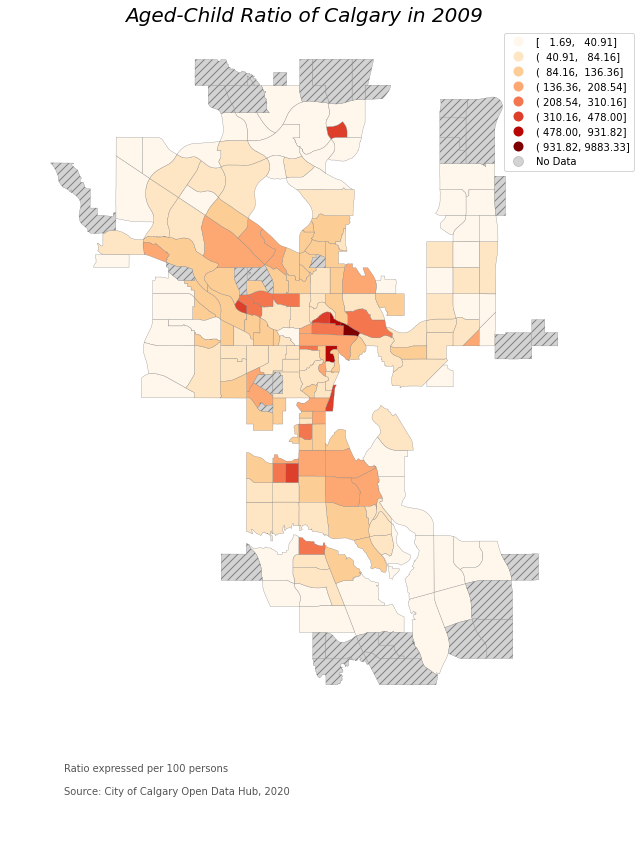

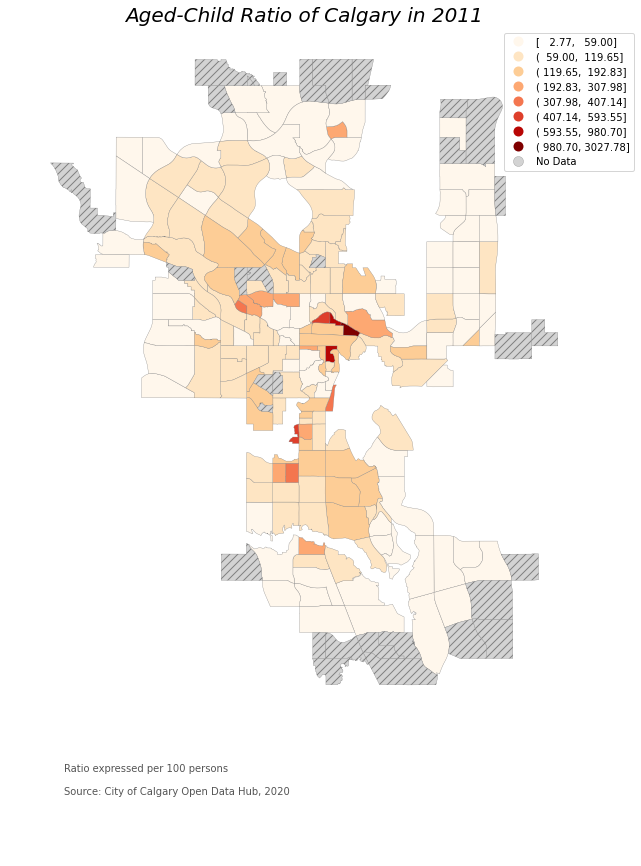

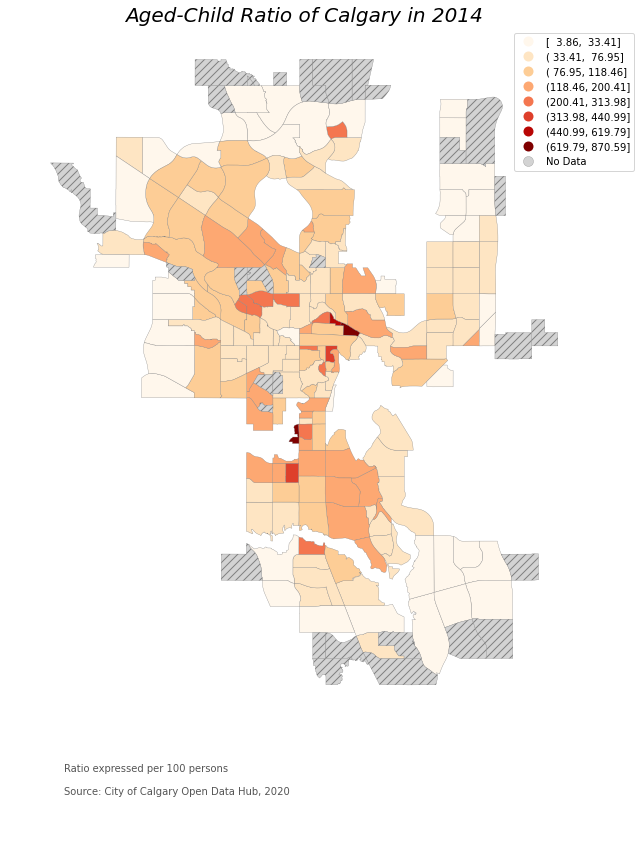

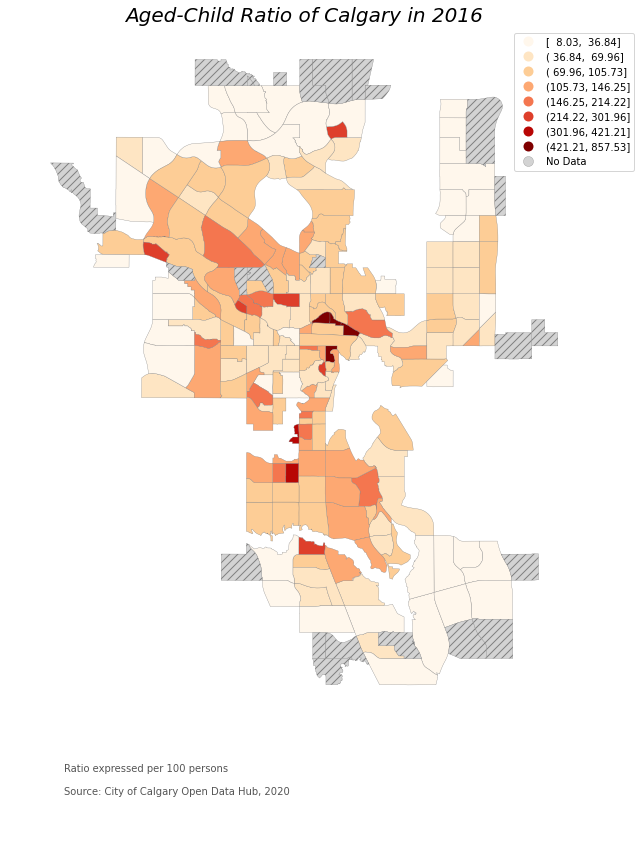

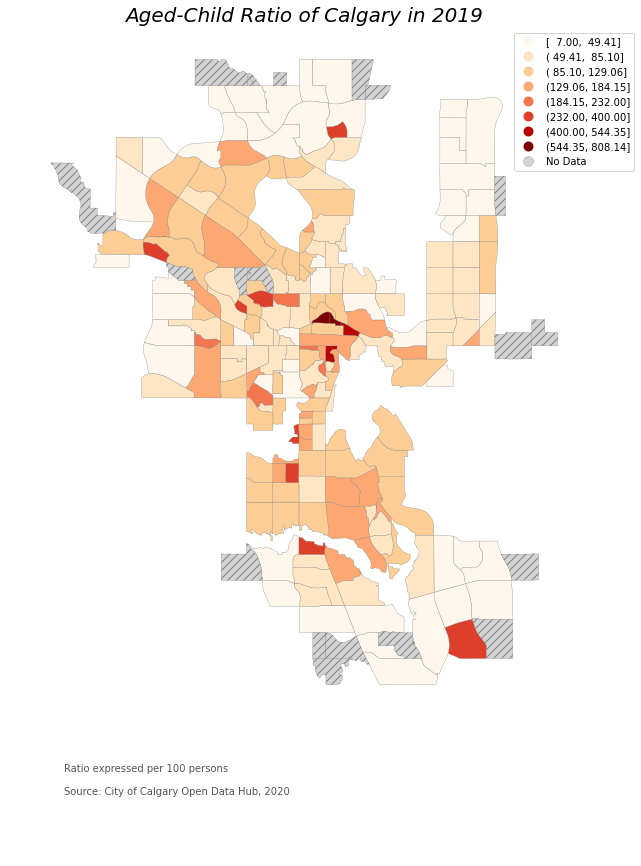

In [27]:
#https://pbpython.com/natural-breaks.html
year =['2009','2011','2014','2016','2019']
# list of years to iterate
# loop year to create map for each year
for y in year:
    col= y+"_ACRATIO"
    fig = plt.figure()
    ax = fig.add_subplot(1,1,1)
    Map = MapDF.plot(column=col, scheme='fisher_jenks', k=8, cmap="OrRd", linewidth=0.3, ax=ax, edgecolor="grey", legend=True, legend_kwds={'loc': 'best', 'bbox_to_anchor':(0.6, 0.5, 0.5, 0.5)}, missing_kwds={"color": "lightgrey","edgecolor": "grey","hatch": "///", "label": "No Data"})
    Map.set_title("Aged-Child Ratio of Calgary in "+str(y), fontdict={"fontsize": "20", "fontweight" : "4", "fontstyle" :"italic"})    
    Map.annotate("Ratio expressed per 100 persons"+'\n\n'+"Source: City of Calgary Open Data Hub, 2020",xy=(0.1, 0.08),  xycoords="figure fraction", horizontalalignment="left", verticalalignment="bottom", fontsize=10, color="#555555")
    legend = ax.get_legend()    
    ax.set_axis_off()
    fig.set_size_inches(10,16)
    fig.savefig(str(y)+"AgedChildRatio.png", dpi=300)   

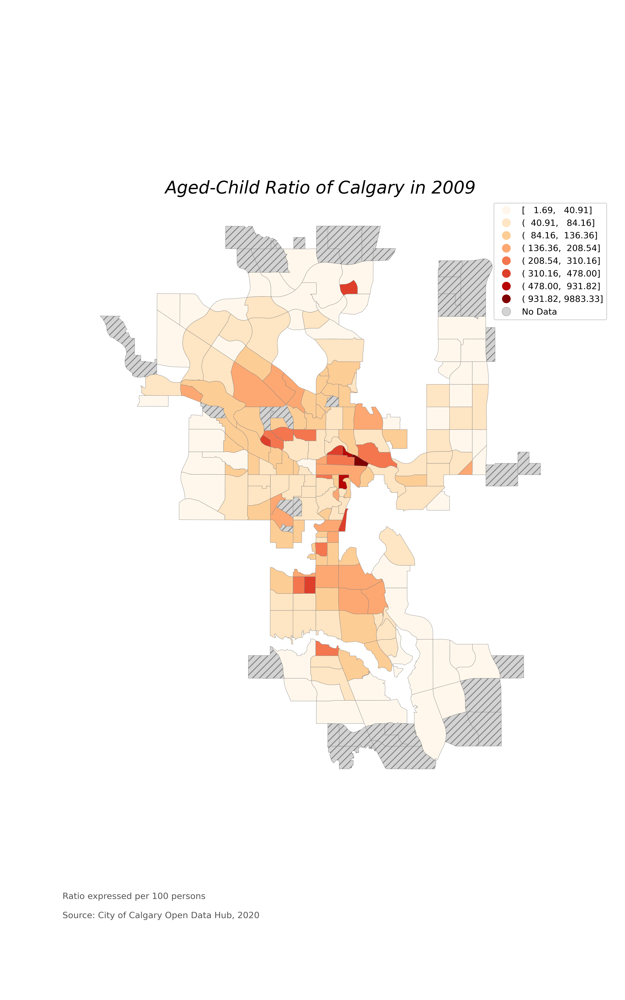

In [28]:
#https://medium.com/swlh/python-animated-images-6a85b9b68f86
#create animated gif from images
images_path=Path('')
images= list(images_path.glob('*AgedChildRatio.png'))
image_list=[]
for file_name in sorted(images):
    image_list.append(imageio.imread(file_name))
imageio.mimwrite('AgedChildRatioMapAnimation.gif',image_list,fps=100, duration=0.5)
with open('AgedChildRatioMapAnimation.gif','rb') as f:
    display(Image(data=f.read(), format='png'))

# Question 5

The dependent population includes children and the elderly that are not in the workforce. This population includes children and the elderly who typically rely on others for support. The remainder of the population makes up the working-age population.

Age Dependency Ratio is a relative measure of the working-age population supporting the non-working age population. This measure is used to express the relationship between three age groups within a population:

- Child Population age 0–15 years (economically dependent)
- Working Population age 15–64 years (economically independent)
- Senior Population age 65 years or older (economically dependent)

The higher the ratio, the greater the burden.
Lower ratios indicate more people are workforce that can support the dependent population.
However, the limitation of using the Age Dependency ratio is, it does not include the population aged 65 and over who are still in the workforce and also population aged 15 to 64 that are not currently in the workforce.


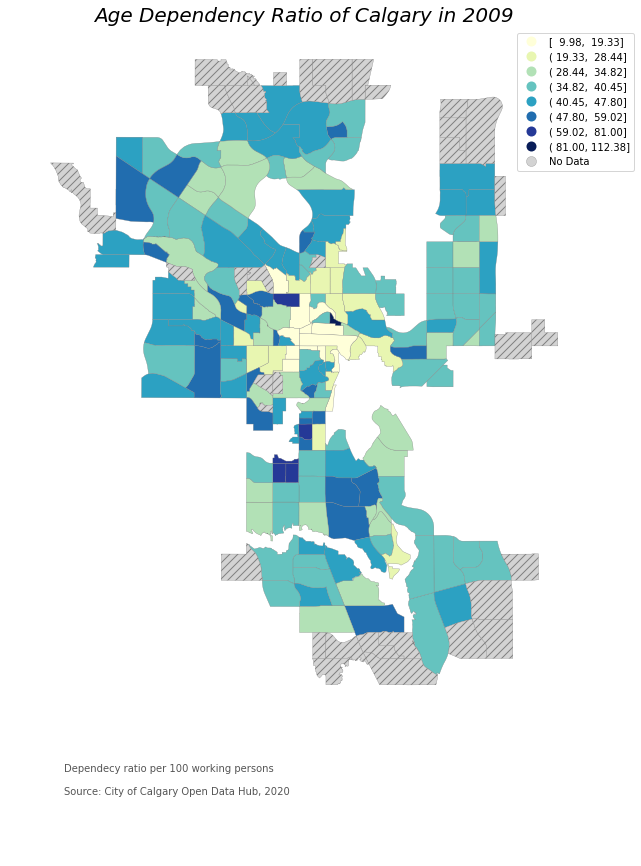

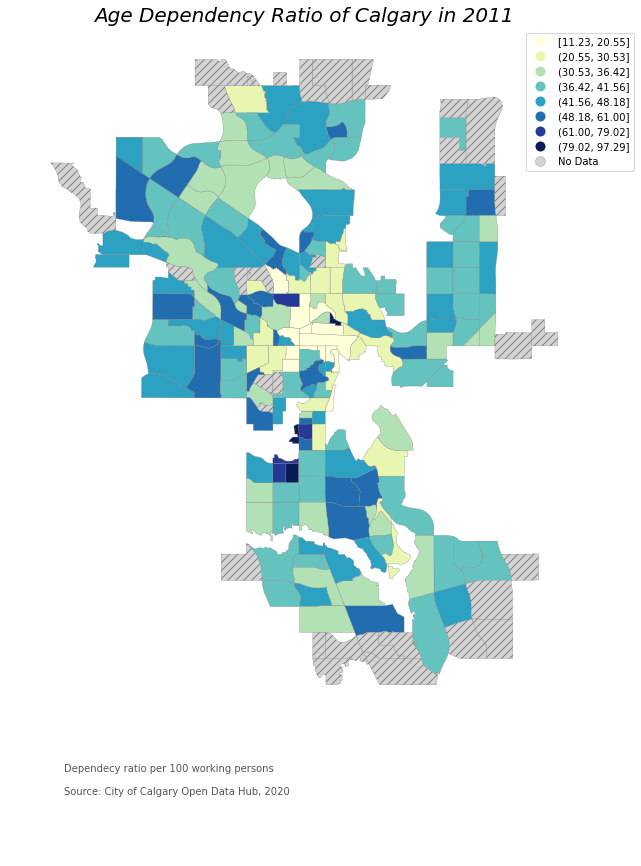

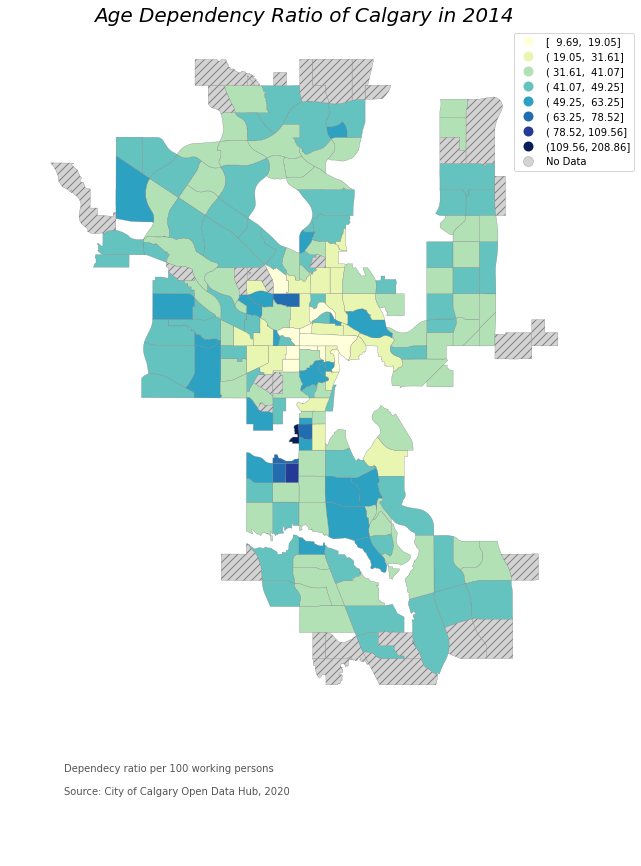

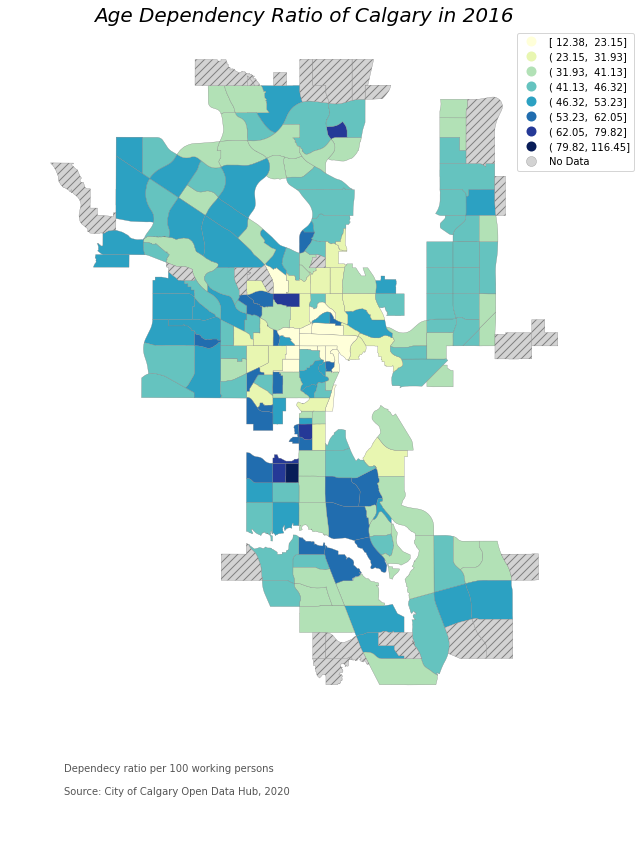

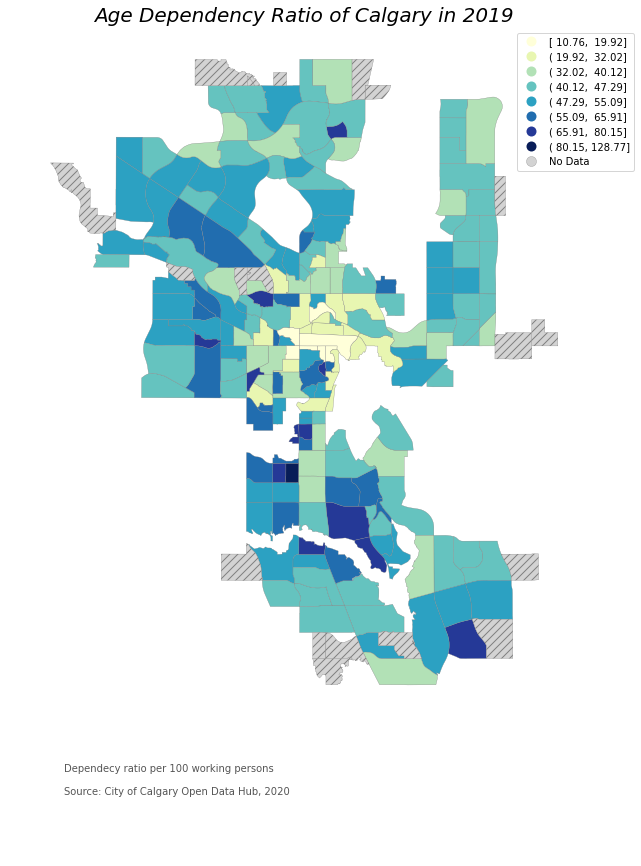

In [29]:
year =['2009','2011','2014','2016','2019']
# list of years to iterate
# loop year to create map for each year
for y in year:
    col= y+"_ADRATIO"
    fig, ax = plt.subplots(1, 1)    
    Map = MapDF.plot(column=col, scheme='fisher_jenks', k=8, cmap="YlGnBu", linewidth=0.3, ax=ax, edgecolor="grey", legend=True, legend_kwds={'loc': 'best', 'bbox_to_anchor':(0.6, 0.5, 0.5, 0.5)}, missing_kwds={"color": "lightgrey","edgecolor": "grey","hatch": "///", "label": "No Data"})
    Map.set_title("Age Dependency Ratio of Calgary in "+str(y), fontdict={"fontsize": "20", "fontweight" : "4", "fontstyle" :"italic"})
    # position the annotation to the bottom left
    Map.annotate("Dependecy ratio per 100 working persons"+'\n\n'+"Source: City of Calgary Open Data Hub, 2020",xy=(0.1, 0.08),  xycoords="figure fraction", horizontalalignment="left", verticalalignment="bottom", fontsize=10, color="#555555")
    leg = ax.get_legend()    
    ax.set_axis_off()
    fig.set_size_inches(10,16)
    fig.savefig(str(y)+"AgeDependencyRatio.png", dpi=300)   

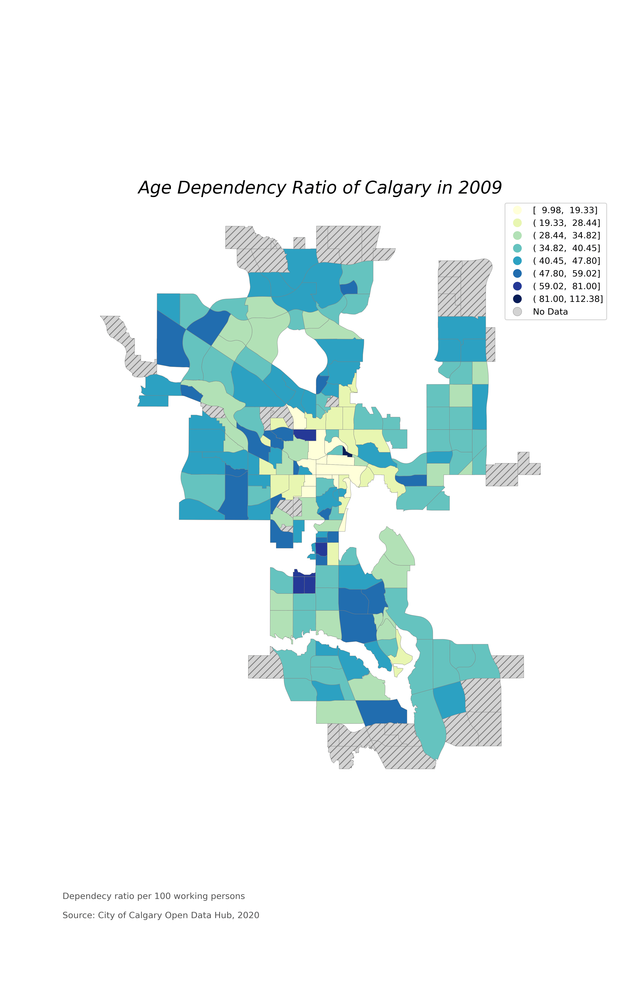

In [30]:
images_path=Path('')
images= list(images_path.glob('*AgeDependencyRatio.png'))
image_list=[]
for file_name in sorted(images):
    image_list.append(imageio.imread(file_name))
imageio.mimwrite('AgeDependencyRatioMapAnimation.gif',image_list,fps=100, duration=0.5)
with open('AgeDependencyRatioMapAnimation.gif','rb') as f:
    display(Image(data=f.read(), format='png'))

# Conclusion

Throughout our analysis, we observed that total population of the city steadily increased from 2009 to 2019, with a spike between 2011 and 2014 which can be attributed to the good economic conditions around the oil industry just before the economic downturn near the end of 2014.

The 2019 composition of the population shows that the City is aging with more dependent senior population clustered around the City's Downtown Core and mature neighborhoods built around 70's. A high Age Dependency Ratio is observed in the communities of Pumphill, Mission, Chinatown, Varsity, Douglas Dale/Glen, Eagle Ridge, Country Hills Village. 

Overall, concentration of the populations reveal a pattern where younger age groups are located around the University District and away from the City's downtown core, extending to the developing suburban areas in the City's vicinity. The City younger populations are in the communities of Evanston, New Brighton, Copperfield, Nolan Hill.

These ratio would help municipal planning authorities to determine the type of services a community needs varying from new schools, transportation services, retirement homes, recreation and health care facilities etc.

Further study of the age data combined with the gender information and population pyramids would reveal patterns in the data for gender distribution around the city. Evaluating additional socio-economic variables like median income and level of education will share a greater insight surrounding the working age population's burden supporting economically dependent populations.


## Future Work

Further study of the age data combined with the gender information and population pyramids would reveal patterns in the data for gender distribution around the city. Evaluating additional socio-economic variables like median income and level of education will share a greater insight surrounding the working age population's burden supporting economically dependent populations.

### References
Cooley, B. (2018) Let’s make a map! Using Geopandas, Pandas and Matplotlib to make a Choropleth map [Online]. Available at: https://towardsdatascience.com/lets-make-a-map-using-geopandas-pandas-and-matplotlib-to-make-a-chloropleth-map-dddc31c1983d [Accessed October 16 2020]

Yong Cui, P. D. (2020, January 23). Create Animated Images Using Python. Available at https://medium.com/swlh/python-animated-images-6a85b9b68f86. [Accessed October 16 2020]

Anon, 2016. Seniors and Aging Population. The City of Calgary - Home Page. Available at: https://www.calgary.ca/csps/cns/research-and-strategy/seniors-and-aging-population.html [Accessed September 26, 2020].

Chappelow, J.I., 2020. Demographics Definition. Investopedia. Available at: https://www.investopedia.com/terms/d/demographics.asp [Accessed September 27, 2020)].

Findley, S.E., Measure of the Total Population Structure and Size. Demography. Available at: http://www.columbia.edu/itc/hs/pubhealth/modules/demography/population.html [Accessed September 26, 2020]. 

Lacey, L., 2015. Lesson 3: Creating a Demographic Profile I. Speizer, ed. Lesson 3: Creating a Demographic Profile - MEASURE Evaluation. Available at: https://www.measureevaluation.org/resources/training/online-courses-and-resources/non-certificate-courses-and-mini-tutorials/population-analysis-for-planners/lesson-3 [Accessed September 27, 2020].

Kwong, Cheryl, Drew Anweiler, and Mary Sarafraz. “CRIME STATISTICS DATA ANALYTICS.” Scholars Portal Dataverse. Scholars Portal Dataverse, (January 17, 2019). https://dataverse.scholarsportal.info/dataset.xhtml?persistentId=doi%3A10.5683%2FSP2%2FIE6NRY. [Accessed  October 21 2020].

esri data development, 2020. How to Use and Interpret Esri's US Age Dependency Ratio Data. ArcGIS StoryMaps. Available at: https://storymaps.arcgis.com/stories/cbc77e4c2b304e87b38111d872cb11f5 [Accessed October 21, 2020].

Moffitt, C., 2019. Finding Natural Breaks in Data with the Fisher-Jenks&nbsp;Algorithm. Practical Business Python Atom. Available at: https://pbpython.com/natural-breaks.html [Accessed October 21, 2020]. 